In [1]:
# Introduction
# Scatter Plot visualization of the COVID-19 pandemic in Indonesia.

library(ggplot2)
library(gganimate)
theme_set(theme_bw())


In [2]:
setwd("/kaggle/working/")
covid19data <- read.csv(file = '/kaggle/input/covid19-indonesia/covid_19_indonesia_time_series_all.csv')
covid19data <- dplyr::filter(covid19data, Location != "Indonesia")
covid19data$Date <- lubridate::mdy(covid19data$Date)

covid19data$Case.Fatality.Rate <- c(covid19data$Case.Fatality.Rate)
covid19data$Case.Fatality.Rate <- as.numeric(sub("%","",covid19data$Case.Fatality.Rate))/100

head(covid19data)

,Date,Location.ISO.Code,Location,New.Cases,New.Deaths,New.Recovered,New.Active.Cases,Total.Cases,Total.Deaths,Total.Recovered,⋯,Latitude,New.Cases.per.Million,Total.Cases.per.Million,New.Deaths.per.Million,Total.Deaths.per.Million,Total.Deaths.per.100rb,Case.Fatality.Rate,Case.Recovered.Rate,Growth.Factor.of.New.Cases,Growth.Factor.of.New.Deaths
,<date>,<fct>,<fct>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>
1,2020-03-01,ID-JK,DKI Jakarta,2,0,0,2,39,20,75,⋯,-6.2046990,0.18,3.60,0.00,1.84,0.18,9.47,192.31%,NA,NA
2,2020-03-02,ID-JK,DKI Jakarta,2,0,0,2,41,20,75,⋯,-6.2046990,0.18,3.78,0.00,1.84,0.18,8.38,182.93%,1,1
3,2020-03-02,ID-RI,Riau,1,0,0,1,1,0,1,⋯,0.5116479,0.16,0.16,0.00,0.00,0.00,0.01,100.00%,NA,NA
4,2020-03-03,ID-JK,DKI Jakarta,2,0,0,2,43,20,75,⋯,-6.2046990,0.18,3.96,0.00,1.84,0.18,8.35,174.42%,1,1
5,2020-03-03,ID-JB,Jawa Barat,1,1,0,0,1,1,60,⋯,-6.9204321,0.02,0.02,0.02,0.02,0.00,2.12,6000.00%,NA,NA
6,2020-03-03,ID-RI,Riau,0,0,0,0,1,0,1,⋯,0.5116479,0.00,0.16,0.00,0.00,0.00,0.01,100.00%,0,1


Loading required package: scales

Warning message:
“Transformation introduced infinite values in continuous y-axis”


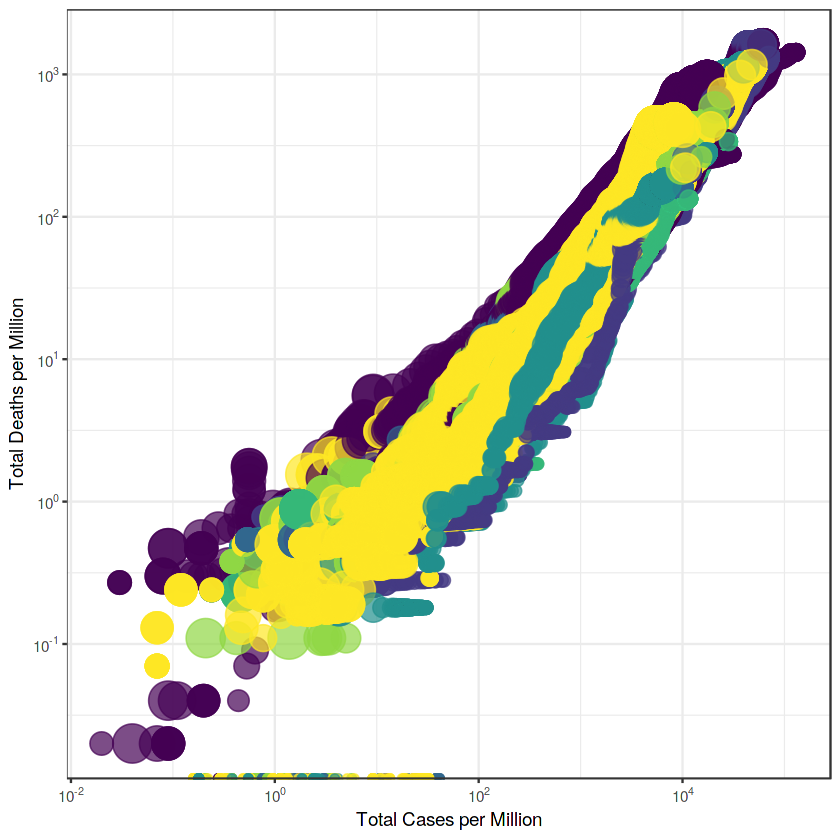

In [3]:
require(scales)

#options(repr.plot.width=19, repr.plot.height=13)

p <- ggplot(
  covid19data, 
  aes(x = Total.Cases.per.Million, y=Total.Deaths.per.Million, size = Case.Fatality.Rate, colour = Island)
  ) +
  geom_point(show.legend = FALSE, alpha = 0.7) +
  scale_color_viridis_d() +
  scale_size(range = c(2, 12)) +
  scale_x_log10(breaks = trans_breaks("log10", function(x) 10^x),
              labels = trans_format("log10", math_format(10^.x))) +
  scale_y_log10(breaks = trans_breaks("log10", function(x) 10^x),
              labels = trans_format("log10", math_format(10^.x))) +
  labs(x = "Total Cases per Million", y = "Total Deaths per Million")
p
            

In [4]:
p + transition_time(Date) +
  labs(title = "Date: {frame_time}") +
  ease_aes("linear")

#animate(p, fps = 10, width = 750, height = 450)
#anim_save("covid19indonesia.gif")

Warning message:
“Transformation introduced infinite values in continuous y-axis”


<img src="data:image/gif;base64,R0lGODlh4AHgAfYAAAEBAQwMDBMTExsbGyQkJCoqKjQ0NDs7O0QBVEgGV0kHWUwMW08QXlQX
Y1YZZFkcZ1oeaF4lbGAnbWEpbmQscWcwdGkzdmw3eG46enE9fERERExMTFRUVFlZWXNBf2Rk
ZGxsbHR0dHx8fJ+TLP3mJf3oNP3pP56XVKCcfP/sTXZFgXhHg3xNh31OiIFUjJJrnJZwn5dx
oJh0oZ57pqF/qYODg4yMjJSUlJycnKSDq6aIraiIr6qLsa6RtbCTtrKWuLSau7ievqCgoKqq
qrOzs7y8vL2lw7+oxMGrxsOuyMayy8m1zcu4z8270dC/1MTExMvLy9LC1tTF2NnM3dLS0tzc
3Pv3w/Ht3v/73d7S4eHW5OTa5ufe6ePj4+vk7O3t7fHt4vHx5v//5O/p8PLt8/T09Pn3+v//
/wAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAACH5BAQKAAAAIf8LTkVUU0NBUEUyLjADAQAAACwAAAAA4AHg
AQAH/oBngoOEhYaHiImKi4yNjo+QkZKTlJWWl5iZmpucnZ6foKGio6SlpqeoqaqrrK2ur7Cx
srO0tba3uLm6u7y9vr/AwcLDxMWZBQDJBCBlxs7P0NHSpgU2Xl1FBgeKA1CRUAcBBDaCXRsB
Bk+C4OI15ecGRYbm6PJnRQUBBULzGujqg3CAmEawoEFoBXAM+iJgSKJukMoMEOHlyQCFBj50
wRHgi0SKFjGC2BjASyEDIzl++RJAiJcbAaqcTFnyDJQaAgYe3MmzJ66EhD58EEQk3wB3GgAI
IHKmij8CCs8QEFHoiYBBIjhACdDszAEbVrFq5SrowA1CVMh6vUGEwCAC/g4Hpe1q9gyODwV0
+tzLt+8poFg1nDET4MYXIgBkQixDoIYXIkvPDPFGqEyXQV+HFBgEgtnlsjY0c9YrebOgzmbK
Qf4sSIjpM51H+51Nu/axqIJqCDZDRVBabxCLYiV9iIoGDV9ubBOUdZBT5MrFEorOnIMglgPI
TV9+pvlp4rbDix9PCLAgoYJuaDDAIQBwbzYCCBhAv0OiMiEEaBf9/Qx+Ae6UNhpHAWzAH2wg
mJGaIBwMQaCBr8V2HnjkVWghX+aV0dAZkPV2hgDqQCQEd9ckosEGJq2jlgbknPiFXGrVNchW
dN1Qg3WnhUAIjWWd1d+FQAbJUwGGVWSAAa0R/vCFFzUAwNQA8jB0QxlQbDiEh4N0WMWWlxkg
ghlDlFSEAFRsWUWXIpRBRE2EGBCCmiWlRUQZYzLV5pdhpnjGBxQK6eefwyCTzAAfdGVGe+PY
QAB+ATjEDgE+TlVIk8kkY10X/qRzBgqVWnoGpgLE00+oAAlBgD64DQKqqLIB6uqrsBqyYKy0
1mrrrbjmquuuvPbq66/ABivssMQWa+yxyCar7LLMNuvss9DuVEYZHlE7rUfVZjuttdVye+22
2n5rrbfiatsttuJ+e+644ZoL7rbsljsuuevO26698JJLb7zx3tvvuwB3q+674fLLL7rpDqyw
wAjvezC+/hIsMb4U/rsr78MF64uwvw0znLDGFxdcr0ezphICDjcIofLKLLOMQ8tCvOwyzDO3
LPPKN6ucs842x0zzzjv7XDPNMN8QdNBD49yzz0gjbXPTMANNNM9LKz01DlhPLfTLUM/ctdVD
O5001WD/HHXVLt8s9ddkly000UeLffbTKLNy1ou4dHUL3rfobcsXJdPidy3T4mLG4JT4qMoN
ZvBtC+KzOE54LoDnHfgshd+iYCaKp8K45IJTfrkskJM+eiynx5K55pzbfQbomFOeS+mqp/6K
7a+sXsvml5jROSqfzy563pTTnjvurei+e+urkAM76bITj0vlrOdtvCu8X/L7KWfp+fjw/n2D
b0v2hF/fCvmVbG/K3cJP337fyLOCPubmyx//Ir7b3fj7f9+vSv2soN74ZgfAVfhPEeorBfuk
tzf+1UKAy7Oe4QqIQNd5b3LTOyAqKJiKMmjwFB6UoOY+eIgEkiJ4DOxfCh9IwlJwcIMvNMX8
JJG/5u1vhbR4nurEt7sWkkJ5tPDhdFynQ1jE0BRFzB0PQyfC8QlxECYcRfccmMMnhuKILrQi
KGaoOiyOgouRiKIoGHdBJjYQh5jT4ifAmDsvioKNjxBjKBYYvgyiURYQDCIBqTgJOYKCjt+z
Yx3hZ7g9jpB5qrCBGcoYO/fdMRYesVwTe4hIz72Oj3jEJCTV/ugJN4oCiLKAoyP8+AkUDlKF
p2Sh4TjZCVCGEhM1XNwlHwmLJLrCk6HIYyP7hss1apGUnmBcGDRZS1ZyopefCOEhebnKSgLv
hqmsIi1foctXTjKIuARmJwCJwTNGM3LG3AQyOznOTvySFYoc5jRdYcvkLTGN15yFKBuhTU6Y
MpB7C6cmynlMfWbCn5lwJSzmyYh6boKbZkQlPh8H0N4ZcnzZtCAxqTlRdjbUEsp8HD83YcVY
eg6aC31gRVtRzR3GM5TnHAUUhBAXKIK0mwqFqSqXqdFmYsKgkvDG75w30gBetBIb1URJjfhT
Sgj0dinVRA2a4bsa8OMMRkBBIe4p/tMc9nQVGaUkMwt5032GYAOpeQI/atCFKpgBB46jY1ER
kZrAeTF1/hudGcIQuLhyVBCzamcpLke9n8KVEG2V6yPs+oijOnQwg1jQrE53OFjiNBFfsos3
hlCEIgwhLjU4kgi6sJLOdvYanl3SSrzwWc6O1rOgRe1pVxva0Zr2s6xNrWhhe1rSxvazsr0t
a1Ub29zO9rdekK1vbWvb37Z2uLF9bXGX9NrVFle4vBVtcFv7BeWitrmzfa51aStd7i6Xus/F
LXbDO1rk9na7xCVuabnL3NCqd7fUde9uw2Ba9Zo3vC/hRGRvIJMi2GkQ23JeWxVRMsEmosCO
0BuCD4G7/ssxVlaE6CuEGTxhRiwYEZC7MGAJvGEKK2J1deVwYtmKvwNrGK8kLsSDVXxgQSjP
wClGsYVbPJjFiljGeH0sIr5kBiFM1h6GoGpCRbrOVtBVkluFqDMvEdknOMQGrJnqS4cszW/i
ca00fKhWtaffttrABqma6iytDMmrqmKoxzsp6pL6Ub1iNXpkJipXk7xlS+iYy4yEniBDWmUn
qnmgbH6mm//3Tj3ns8isMCz2lry+Ke/yb2buIJYjQdD/BRWWHb2zncfM58hFGhVovqWWgxho
7jna0DGlMjhtWtM5b3oVd5t0RODc6SsjGquX7l2pTcHTW59Z1oWdHbAdUekO/ubaEsVOhKbT
x+mqrjrOaa4enSOI7GUnbpGfPsWgO1hok05bnhGFdbNVnUlfSxrJrfZzV2F9am+n+tEPPHYl
hp1gec+b0aUQsLlBnW0k0nvGf0Yqvk84bnj32dm2JuS3QxluWW57g902YsRvN2o9rntx2N63
tvudRVaXz+PMZneo3elIaFsU5PRDeR+JyHFSjDzRE190wCl+8Ta3fBQPB6GwXf1xmr7a4TcX
xcvfvGfC/XsRirafY1mucX83vRRDJ/TMZc5lkQc9l1cHRVZJPXX5NbzNR/8wrRG+yaf/0N6T
SDYirD2JXpucpGG/T8zPF3cMoz3tA5diwVFN5Lcn/rruDAa8IZJuwEzrL8/unmmtyy7tdNc5
5EA3O84FX4i7SyLqqaB85S0fia8LOuufyLkpOB8RzQPY9C4mPbF3rcDXod4/Yyd37ST/SdU3
Qu0lZLrfV4F5iE/P9hZ+PeENmPcx7j3xVqV9LoVfcZQWf44Z3/2vlQ+K3p8C9y4EPv5Yf8J2
S7zki5dz43sufWXrPvzUZH7RZW9E7ROY+6OwwbzyRf/62//++M+//vfP//5Pywv+F4ACOIAE
WIDwAoAGmID5FwYK2ID2JzAOGI

In [5]:
p + facet_wrap(~Island) +
  transition_time(Date) +
  labs(title = "Date: {frame_time}") +
  ease_aes("linear")

#animate(p, fps = 10, width = 750, height = 450)
#anim_save("covid19indonesia.gif")

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 10 rows containing missing values (geom_point).”


<img src="data:image/gif;base64,R0lGODlh4AHgAfcAAAEBAQwMDBMTExsbGyQkJCoqKjQ0NDs7O15/OzweRD8hRj44WkQBVEgH
WEwNXEgGV08QX1ASX0ImSUgtTkowT1Q+WkwyUlQXY1YaZFkeaF0la2AmbWEpbmQscWk0dm06
emo1d3E+fTRMXjpSYkNDQ0xMTFRUVFtbW1pHX0xIY1VSaVJPaHNBf2NTZ2RkZGtra2hteXR0
dHx8fHZveF6AOza3eTa4eTq5fHOGW5+TLP7nJf3pOJ6XUYGNdY/XRJfZUKfhZ/3pTTNpjzFn
jjdrkTxwlXZFgntMhntLhmVcmH9Rikd3mn95gXpzp3Rso1VLjYRYj45kl5Frmox5kJl1oZ16
paF/qSKPjSKQjSqUkTWal0y+iEWhn1qFpGeOq22Tr2eQrXictFqrq0+npH+hunu8umSxsE/A
iVPCjF3Fk2vLnGXImHPNon7SqoODg4yMjJOTk5ycnJ+bg6SDq6qNsbWbu7KXua+TtoKjuqKi
oqysrLOzs7y8vLTkhIzXs5ncu4bUr6HavtPwtKKdwZu1yJGuwaijxb6nw6S6y7WyzMGqxsaz
y8q5zsu50InBwarcxL/P3a3T07LS1bPkzbvm0cTExMvLy9XG2NrM3cLY3dTU1NzR3tnZ2cjs
2tnx1/j23Pjy0d3U48nW4ePa5dfp5trz6OPj4+Xi7Ozl7u3t7ePq7eT27fX15+nq8PHt8uv3
8/T09P////X5+QAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACH5BAQKAAAAIf8LTkVUU0NBUEUyLjADAQAAACwA
AAAA4AHgAQAI/gBjCRxIsKDBgwgTKlzIsKHDhxAjSpxIsaLFixgzatzIsaPHjyBDihxJsqTJ
kyhTqlzJsqXLlzBjypxJs6bNmzhz6tzJs6fPn0CDCh1KtGjGAgCSEngBy6jTp1CjSjVZ4I0q
U3wMGFA4wFJESwcCEHgj0BSJAAYqCQQrlmwsswIM8DGo6mxagXwKBCiQx6BZtGoHxnkxtbDh
w1ALxBmYKoCehF0hwhogQ1WlAYsNvDAVJwCqyZUvZ36hqrOqgpo5BzDVOE9pAJxQbzYdy5Ib
AYQR697NG6digidy70E6gCwJAAL2xOJ0lsDiWARkFKwkYKAME5YCNI11AA516yY0/gHY3p1g
dvJw9hAYSODxQPHoYw0ukLu3/fv4T/4e6IZELFkBWLUHbLFEBgsBbqjCR3Kx6OEVQbCYMtAB
b+hRwEAvMBWbQBRaiGF9DV4o0AsuDGTKHgJIOJCHI9bnAoj5xSjjjBXtJ1B//2kiECcBeBXZ
cNbBaBBzJKQCxwHgDUSkkUgKdB1BR1p3gkCpADBWQVE6acKHNHbp5ZcJ2RiLCyXGAgcJBpjQ
Y4FevRGAAAPAOSVCsMQgwBuyhMhlnQK4IRCLsWTYWQAlAEpiQSbo0ZkAJBjqopBgRirpfTbC
IsBjC+oYiwBqRZbHVgJdlRAJJaQy0HkCkWBcCaetpR2H/nCY92osqrqx5YgxyLqdqlxO6uuv
uxUARyqWaSVQHgOoooobACg3wFyWwgGLJZc2qOlAewSgCSfcSmiADLLoEYCCAmzbbSzfypJt
qwOlK64q2e0By4LKEfQtLOsO9CKw/PYbFVJJDeDCdrKc0NYbBNTpWG1hERArdNIRxGxSSW0J
VwFq9UBxxW+RENdcBV0cWB4E7PUcQSITlKG/LLfs8sswxyzzzDTXbPPNOOes88489+zzz0AH
LfTQRBdt9NFIJ6300kzPCAssqTwd9dOwuGL11VRDrbXUW2c99dRbf9012FyDHTXZVJ+dNtdr
h+2212yvbXbXbc/9dEFty113/tZl7+232nS/rXfffIvNtth2Dy644oYfTjXedqMNuNZoC244
4KxU7QrjgRNOueNuNw4655U3Hjksea70whust+7667DHLvvstNdu++245667634S5MLuwAcv
/PDEF9+7vsUnr/zyzOvOkhvcRi/99NGbS/312FuPffXbU69999x+D/714o8/vbnH33i++eGz
37775MMfv/nlZw//925ZB3797vO/Pvv+8578BDhA6ZVPE/lLCfQKyMAGOvCBEOxe+mKxwAha
sIABvKAGOZFACm7wgyAM4QA7eJIKivCEKERhB02Ywha6MIITZOELZ0hDAJLQJDKsoQ53OL0Y
8vCH/kDk1gqDSEQd3rAkOSyiEkM4xCU6UYQILEgSiZjBJ/bviCSZohMtUQIrNtCHQIyDDDih
CRPEYXpviIMb3uDFBjbxiXEoQPReYAI0nlF6MtBDG6mHxZFocYmWIMEeRyjFIIqREyeAAx/v
KD89/BGIYHwiHAygR02QoI7SS+P08jjI6vVRJI8sIhctYYITnMCSnHDDCThhgj2coJRVBOIb
eSjGGIyRE5V45SnTCIdevugEMThBHCpRyl2+IJiaOEGjTFBKTsAhQ6eMpQhnucTBvIATe6Bj
LmH5Bji4IQ+cyGMe83CCKYCTk1b8ZEhCSUQu7kGPJ6jEC1xJAkvqAZ6V/uhkJGlpABLEgFvv
RGQl0shL6JGAD5Y4QUDj+YYYaGKcbljoQP8pA3BCspBWhMMb6hgDckqUoGcUpxu62INz6vGJ
UVwJO3+oB00EshJkOgAf8qDKF8QhBjB9gUw7SU0d5sEFzNkDLl8kU172UpEl0EQZYeqCoiry
m3mQQU4PMNCnWvSHHbwlHN0Qgz1gxwRMpWoav8mJGOhBBiUggSXeYFIvqhMkK92hJS2hBxN0
lJV8sGQM4nCAPLxAjybggz4x+kMxaoIP9fwrJ0rAB5DC4YzhKaNiS1CJx6YyD46cbGPP6IaT
OlCa2NvnEjW6hxclVLMERepZ9fDMN8hhsZ5d/mJKVRJXDUozDiRoVB5MQKYxkiAPlhiAJuoa
HK3SUJqi1eEhH9rZUr5ABo6FrFJfsNvearJCiN3oCVwA3TNWKIg9vZ8I48BGvpCSuM9NYyVK
wNs95FETJcgDe10gVCqi8XmdfB/98hteINZPe6BNJ2HzS2D6vfUjtS3wYCWm4AaDb4LGdbCE
o3dgjyR4wk6crfowzOH+cji/GkZJXAP8YRQmF4MlrqGHU7zHCnfkwvDbBIsviL4BG3DGXjzx
hEnMwxCfRAZAloEbgkzkIhtZyEeWAROA3IMp4KDIQ06ylKds5ChTmcpWvrKWhxzlKQD5YQOx
JZavHOUsH9nMWk4z/pDRXGU1t7nMbraylU8mEDG7+c54TjMTlqzkHgDZyzLAgRfWnOcks1nN
ZnYDnVEiVUtUwhKQjrSkJ/1oSFd60pi2RCIufelMR7rTnqY0QkPtaVBbOtSVMDWpHZ3qU0M6
q6p2NaUzHWtI86HWpV41pisxalTvWteuTjWud13pTncQp8CW9LAz3etkO5rUnX40ryF9iWdb
O9fOFrazLW3qyrLkDdt5SLgfkorUiVsiporIuBtStYjIwtxQKgi41Y1uiaybIbJIt2TUfe+F
9NtM8v53QgSeEH2fGyL5tje/3Q3vgYA5JfPed0QM7hCCHyTh9Ea4xQ3ScIfLu+P+RjfI/hWy
cYNQnN0LlwzIHx4LPGUcIuw6OEROvhBZlBxCNx8IyGXB8pO4XOIzH/nA3U3zkCPcFQw/CMt/
LnNyKxzhRSd5ypseb4IwveIif7

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”


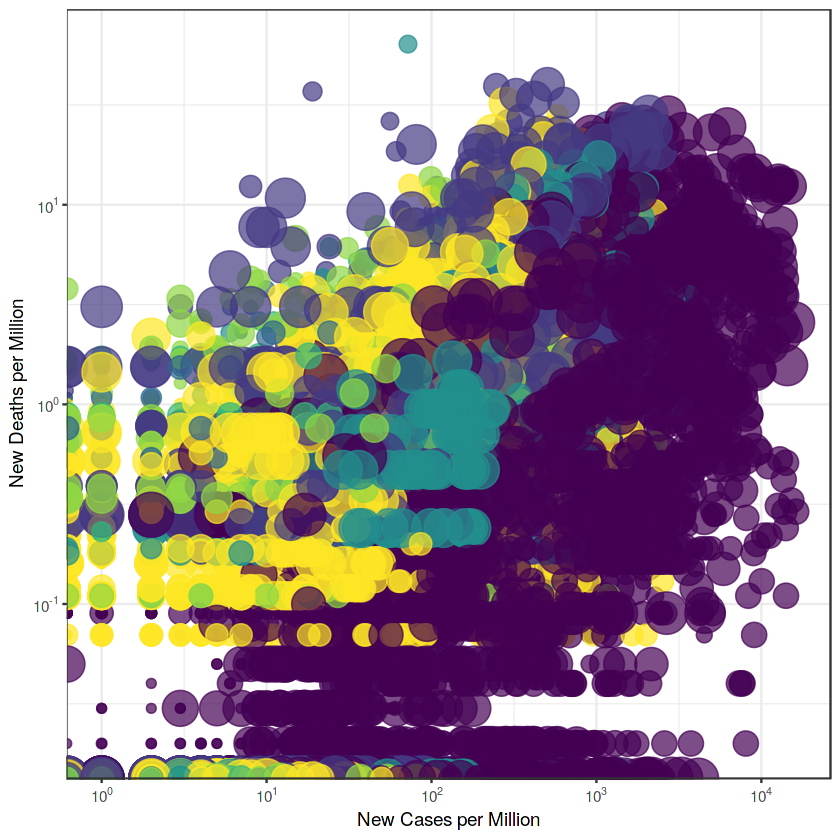

In [6]:
q <- ggplot(
  covid19data, 
  aes(x = New.Cases, y=New.Deaths.per.Million, size = Total.Deaths.per.Million, colour = Island)
  ) +
  geom_point(show.legend = FALSE, alpha = 0.7) +
  scale_color_viridis_d() +
  scale_size(range = c(2, 12)) +
  scale_x_log10(breaks = trans_breaks("log10", function(x) 10^x),
              labels = trans_format("log10", math_format(10^.x))) +
  scale_y_log10(breaks = trans_breaks("log10", function(x) 10^x),
              labels = trans_format("log10", math_format(10^.x))) +
  labs(x = "New Cases per Million", y = "New Deaths per Million")
q
    

In [7]:
q + transition_time(Date) +
  labs(title = "Date: {frame_time}") +
  ease_aes("linear")

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”


<img src="data:image/gif;base64,R0lGODlh4AHgAfYAAAEBAQwMDBMTExwcHCMjIysrKzQ0NDo6OnRsMD0ZRUQBVEkHU0oJU04P
XVQUVEUjRVY7TkwzU1U/WlsgZ14lbWAnbWIobWYvc2o1dm05ekREREtLS1RUVFlZWWBKZXVC
ZWRkZGxsbHR0dHx8fJKHL5+TLf7nJpKKQv/uZf/ye3pLhZ53iJ17pYSEhIyMjJSUlJycnKuJ
laODrLaYormepaCgoKqqqrOzs7y8vLyjwsGrxsezzMu50MTExMvLy9LC1trP3dLS0tzT39zc
3PHx3d7T4eDV4+Le5uPj4+nj6+3t7fPv8/T09Pn2+v///wAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAACH5BAQKAAAAIf8LTkVUU0NBUEUyLjADAQAAACwAAAAA4AHg
AQAH/oBOgoOEhYaHiImKi4yNjo+QkZKTlJWWl5iZmpucnZ6foKGio6SlpqeoqaqrrK2ur7Cx
srO0tba3uLm6u7y9vr/AwcLDxMWZBQDJBCFMxs7P0NHSpgUuSUg4BgaKAz6RPgcBBC6CSBsB
Bj2C4OIt5ecGOIbm6PJOOAUBBTXz8OqDMEJMG0iwILQCMAYpEWAjUTdITAaMSNJjQEIDIJDA
CKAk4sSKF0NoDJCkkAGRG5UkCVAjCQwAQ0yiJOnERwsBAg3q3MkTF0JCIEAIupFvgLsDAATc
cDJEg7iETgiMKNRDwCARHIIEaObkgIuqg0ZkBcD1wAtCQcgKMnuDwKAC/g0HpS17FgaIAjl7
6t3L99TPsBqcNAnwIskNmE4eNjGqBIdSJza8EWKCRFATrzYKDArBrPJaF5k354WsWRBnwU6Q
2BDgWVBo03lP951Nuzamv4JaBG4iWau3h0TDjj7UVIOSFwfCchhU/HhyQWIJIVcuaOW4QtOh
L4dtu7v374lwOwkqCIYGAxwCqHvoIoCAAe87JGIiQgA50qKd0BfgzkmNbbBtFMAGrzkRglCE
cGCDgASWZmBeIAwH3oQU8oUbEwzdI0AQggjwmzc1POdEEiUhosEGJda0lSAakHNiilrRRYgP
K3b1QgvbGSjCjDW2mF+FQAa5UwEvqNSDNoLU/jCASi0AsNQA8iz0AhM+ZGgDh4TcsOEQXFZm
wAhN2ECSY0FwOYSXYN5AEyFfMqFmEjTewIRjS7EJppgpRijknnxGg4wyIHDVRHrjuEAAfQE0
xA4BZ0U1FSFNJpPMckg4lY4TkUpKqaX2EFKpAAX8UwMB+kDlqQYCxEOIbH226uqrsMYq66y0
1mrrrbjmquuuvPbq66/ABivssMQWa+yxyCar7LLMNjsbE0x0BG2003Yk7bXWVkvtttRey222
0kKbbbfakuttuON6Ky655bIL7rfbohsvvOOue66297Lr7rr2ckvvvvKqCzC+/qb778D9zttv
uP8aHDC/CJs7bcQO/ie8b8MTo5tvvQYnzPG6TbAiQg0kkwxDySiXDMPKK6esssson5yyzC/X
HDPNMcOMcw078zwzzCq3DLTPQ/e8M84nyyy0zkzn/LPTM7d89NNAG021z0sX3bTNXBN9c9dT
a3211zxnLfbYVkNdNtpjt81yo6rA/Qi0rTQRMit0s2J3K0zcvcreeHP1t9+q5E2K3Kgg3ojh
qhBeuOCNO44K46kAvgrlqEg+OeSiKG6K54tgforlj9ftiuimkJ4K6qWovvnnrICuCOukuH4K
7aPYbgruomh+O+eZ+14K75k0IfsoxyNCPCi6Dw/86MKTsvwnzUv/fOrRjzL9JcmHch9E/tcP
n70o23cyPvnh134+KOVzUr326XPSPSjzF9L+JuuzH3/v+XtyvybvQ5/p+LY/TdTPEwccxP+K
179OLBATAQzFAy8RQf3VrYGcmKAjjBc7SWiwEhX8xAcpgcEMFpB5JdTECCeRQhWeEBMJlJ8H
X+iJFmZihR604SX6NsDAXZCAsFtFDPVDQ/Pp0BI4jEQI/XdEEDaREkmExBIdWMRKDNGAM/yh
D/V2uiri74mTiOIjpmjC1l0xE9+bmxcBCMYs6q2NkRDjBuEIPi1ebo2SOCMM3Tg4vtFxjH90
hBwbQcZNDJIRgRQkHiOhR+7xMXJA5GIk/9ZFP04SeR2M4yIp/phIRhxyEYVUYSdBOcrZbdIS
obxhKQXRSEsM8ZOKSCUmYJkIWe5wlYiwJRJP6cRLdi6TdcQbLg9By1xWUpJb7GMyMbmKNCqy
h3e0Y+ne6MvMHfNwwFSjNFc3TEPoshLFJGY37cdLEo5zMuVkRCut+MjKnVOB6ZTEN6EYTyVe
s3DvFAQtOSjEdgavmre7pzsBij2CIjCbz0RmNKm5zIE21JoG7cQ6KfHKekpRoJPLJxEt+VDo
RVSG/dTkNl/H0IVS8qP8QykWm+lPj3Y0dafT6DzDaNExYpR+CF1cTeeoUhRyVJkmxWdP9xjS
YAJ1mkdd3U4JedPdNfWgRdVmSZHa/rinqm+oNdToPic6iYpCk6oODerqrJo7rS4VOzn15FlJ
iVUjttV9Zv2qUoMYt5YW9KXDi+lIf7fX3a2Sn3UV6VTnOtiM9tV5ciUpNqOa0KQqFpJ4rR1Z
UxpZkAbWqIWbbCg0utHC8tWzu1vrILiaR7u2Lq6gRWxqrXdY1taOtJFwpk5bC7/Eftaxt4Ws
WEMBW0h4VaFCXW1thStA4BJ2sZeVKm5DS9vinrSy5EMtclPx2+Wq9nLS1S1Y/wndlSa3sdo9
bngfG9btunS3OGXsbI1LXogKs7kSFG0ts/tL9aoVvhYkrgRlSl/3oreGvX1Edav60/HmtnKa
9el7SxFg/kcMmJtvxV+Cqdff21X4Ew1uxIO5+9/TRpiNH2ZgiBmZ1tDJN5cX9nB3FdxhyY7Y
t6yQ7X31m9/ntrisL0blhFGZYXWa9qorpnCOexnkrA5ZwyU2JX5FqNUUu3jB1nXtdBMXsrtV
ucqosTK0sMzlLHu5y1jOcpitjBr9kHlvYP6yZQQzZjVfGTUdcTOby5zmN3O5zqjh4ZzPLGY6
71nOXc4y3ey85jv7Gc2AdnPeCO3mNhuaz2DuyKO/7OhGU1rNPMRzmvsM6T/3ecuJ1nSo2dzj
RbjAbn3rm91QjepUg0zVTVD1llkda1nXmtaxXvWsU13ria2a1rPO9a11rWtY/tsa19T6tbCX
HexjMxvWxc61rI/Na2CzGtrCbnarpZ1rSSPb2NbG9rSJPWxXB/vZ5LY1ttFt7Va7WtnMjna7
2f3rifm62rsuN7mHne1rK9vb40b2toEN7V1Dq9SK2PDoduxWKBuYuew9MG+TPJ8TH2KmP9Ye
w+F6ZBY62bLUzThlbzxy896V5Jv9+CYQngiFn9zkKsbukv1ncW82ma4hF2yUh7tzUSiBvx2X
58YpSnHl1bwQnA2nN/UacYj3PL44T5zIUx70ON6cxiI8OiEwrvPesRwRLo85zIGMcvYNHcRF
dmXRian1QXAds+UVb9zbe96xg1zqXYewwxFcdSmq/nyzZy8tS/PuX7tHt++ARLwg/56Jrx8i
7GQ3/H4LPFbFE5LxFHS8ISCP47RzfO8cljyLRU/U767XxqQ3sue/aHlEYt6R9jXxzKloW6c/
/LoEXn1X124IpSP96k+vce7LLmTQp9f0Mw5+1mdfRqzTnPJ0xzDvycl8Q7Z9za1nq+5FvH0S
x17Jzqd9+Juv/Oc3Hff1Rb7szy/l27d/7hKvu9wn/v2KV9+FtUd/6Ocv/+hDVf3gV37iJ3PG
B1PZF0tMN2WnIGPrJ4Dk537aA3

In [8]:
q + facet_wrap(~Island) +
  transition_time(Date) +
  labs(title = "Date: {frame_time}") +
  ease_aes("linear")

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 20 rows containing missing values (geom_point).”


<img src="data:image/gif;base64,R0lGODlh4AHgAfcAAAEBAQwMDBMTExwcHCMjIysrKzMzMzs7O15/O3RsMDscQz8hRkUBVFIT
X0ImSUw0Uk47U1U/WlMWYl4lbGIqb2AmbWQtcWo0d2w3eG46enA+fDRNXyteXTRBSjt1WTdP
YDtSYipmZENDQ0xMTFJeRFRUVFtbW1lFX1BNZ1RRaVtZbUlFYWxeb3VCf016ZFB7ZlRycWRk
ZGtra2l0fHR0dHx8fHtzfWdkdmGEPDq5e2yDUnOHcJKHL5+TLf7nJp+WQp6WTZKKQpTZS4/X
RKLdY6vddrHjfPvrXP/uZf/yezNpkD9ylXZHgXxNh2JZl0Fzl2tjnHFpoHlypnx1qIF7gphx
n558pyGPjCOQjXyKg0ejn0a+g16IqGyTrmGKqEykokaioFSopl2rqVCnpWSxr3m8uVbDjV7G
lGTImHLNoYODg4yMjIyQi5OTk5ycnKCdh6CelJ6ZvaKBqq6RtamKsKKioqysrLOzs7y8vJrb
vP7zjv7zlPTpitnyvv/2sv30qKOewq+rysSvy8i0zca805vKyY7GxKPRz7fb2r3p08TExMvL
y8jF29bI2tTU1NnZ2drT3MDY193zxsbp3NvnzvHx3crY4tvU4+Pa5cjj4tfr69ny5uPj4+Lt
7+zs7Onk7fHx7fT77ezs8vDr8ef18uv18/T09Pz+8/f1+P////f88gAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACH5BAQKAAAAIf8LTkVUU0NBUEUyLjADAQAAACwA
AAAA4AHgAQAI/gBTCRxIsKDBgwgTKlzIsKHDhxAjSpxIsaLFixgzatzIsaPHjyBDihxJsqTJ
kyhTqlzJsqXLlzBjypxJs6bNmzhz6tzJs6fPn0CDCh1KtGjGAgCSEpBhyqjTp1CjSjVZgM0n
TngMGFA4YFHERQcCEFgjkNOIAAYUCUS0IMAAsqnMosVjUG5agXgKBChQp+7ZuwPdyJhKuLBh
qAXcDPQkwE7CrhBNDajxSdEAxQZicHITQFSpAUAqX06V+RPnTwUNyNgcwBOnAHVMA3iUevXp
VIvUCBh8uLfv3zgTEzQRQ+AdpAPUpDoAQMCdVI9EiFWcikCNgooEDKRRwhGApsvb/igKMLBG
9+8CD7QhuCgAePV3CAws4Hig9/fr3cQowBu4//8AniTcQGqIkAoqAViFx2ypQGYKAWp8godz
qdjhFUGmcDLQAWvYUcBAMjCl4YEceghifxV+KFCIqZwSlx0C0DaQiSv2x2KAOOaoI0YDClTg
gY4I9EgAXkF2XHkoHhSdCJ60cUB5JQz0yAhMOgklQVYKZJ5An4gF10BZprJljTuWaeaZCfWY
SgzFpdKGCAaUQGSDXq0RgAAD4GlCQqbQIIAaqFS4FZl9/ikQjamEyFkAIyAqQ5sDlWDHoo2q
mGh/MSSJ5qacAtijKY2lMmGQqQigFmR1PMnliAeJMAJq/gK1B54IZHUwgicDyZreerm6J5AI
bKgR5Yo0sOdrKsCe2OmyzP5WQBueVKaVQHUM8MknagDw3AB0gSJAG6AsEqodpA50RwCPPMKJ
uqTVgIodAUgoACTpsmuAu+fCOpABNJiSb3t3mIJHAHQRdO+78Q6UabMMNxwVUkkNEAN4qMg5
1hoE9BmAY4ssIAABvFpXULZJJRUlJyIIUIBaQARQMgAnp2xAwQShrLJaqdRBwF7U1SwzzZc6
LPTQAbqYESqBEq300kw37fTTUEct9dRUV2311VhnrfXWXHft9ddghy322GSXbTbTpqTtidqm
rO12222vDffcb8sNd91s3802/t5058233Ha/3bfefePtNuB+J2543gWlvXfij8cNOeGIU563
3odDjvjmllsuiimggFJ54HSP7rjgnKfdOOZ3m87646hHvnjhg7ueOu20G2474awjXkrooJuS
tEoyrGH88cgnr/zyx6vB/PPQRy/99NRXb/11BMVg/fbcd+/99+Avr1z24RvvfPnop9/9+dU7
z5Ia9cYv//z012///fjnr//+/PdP//gE8p8AB0jAAhrwgADU0gEXyMAGOpB/X0oJ/B5IwQpa
sIAJFNMFN8jBDs4vgqmYoAdHSEIHgvAkIiyhClfoPxCmkIUwjOH/RibDGtowXSc0yQtvyEMS
ZnCH/j0M4gZdKMQictAROSwJEI3IxAUSsYlQbGAGaxDFKh5wDcNDyRKNuIgRWLF/P7yhG2iQ
rhK4QX5rcIPzvti/JxqxDQSoVwxKgMYzxq8GdmDjI5JIki0WcREi0KP+3ChDN1DRBGv4oB39
VwcqQpGQQnSDAfIYHTrGL43yowElv8jHkfhRiF1UhAlKYILo7JGOJbjDKEtpxTDasJEycKQo
SblHN6yhDW3IlAloYAI3KIKUpVyDDHjpCBOIwA7A3OMwTeCIG0IyiG0I0SPuIIMS/JKWaVRD
HR6BRzzWIQbafIQmmYjE97ERkHfIowkUIQM7GDM6dlAnHlpJQxtKcgQy/khXOh+xzjSmsQ3w
G4EiRLlPE+BhDWSkQR3sUIOCHjSh27ShK41oSzrWoA6pvAM/FXFLTHazBl4MJx6biMWVfJKH
2wxlpg6Ah0aaQAZwoIEiVjoIKz6ThW4o5Qg0OlMZsPSfuGzDlB6xCGuyiaW4fIQ27aCGmcYA
qUINpw1vysM2IPQOJVjEOo96UDVus5tUys02x8nETorkpDcUwSKQ2c4p4cERIqCBG0RQh7aO
YJ5VnGghqYiHQNq1q/88oxcdUQK7cvSM2oRlHgWKSanWcIpNVOMdMlXUv/pTqI3CYxtocMsp
bbKIZg0JWu0pgmMikzg2mJIvB+CI08aSngQZ/i0HDZmuGuCRlDGowWXbcEY6LqKduK1BUjvU
1zWUgE3CFeoaNDrVelI0kXwpqmt160sRHPcOIx1BHUZwXXKGFiSyFSQnnSve8s5Pr+ZN7x6z
iEL1ulep5H2veKkqX5uas77lpS9+oQjZ/Qryux8Jr39viN4BR1G/Bl4hvewHYI+80BL2W7AN
IfzAS8SwwAlm4kQlnGESUvgRmLhfgztiW9uqAQhRKLGKa5CFGkgBxTuAMRVWXGIq7GAHalBx
jmnM4xUDocQwVkOLbbuDKPxYCkFw8YxZ3GMqAGEHS+6xlHdcYipTucdqyDGvtkPjK0u5ymD+
spi9fOUc7zjLU64B/pRLPOQaeFnFM26zjk3sZjbzGMdGfnEUbjzjKPdsRSreAZbFTOhBp/nL
Zh4znQtdZ0avuMUorsGM19zlGvwZJTVYxCIUsWk8aPrTn+a0qBcRCFCbGtQDHQSqTx1qVi+C
EZuO9SA4bWpEzFrToh7oqQlBCEQwQtSedrWpR71qXGsaD7QeNq5BmGlQI1vYqya2q3Ud62lX
+9qt5vSzoc1pVVc72cMOtrRpTetgQ1vTgdB1ssHNbFObu9WnBje35W1sZdP71NvG9rCpzW1x
n/vexd72vRWx5ZQUPBW44ggqSuEQ8BiEvZ5gL0IkPvGEM8ThCxHeQg5+cH1lvOEYV0jI/hNi
8Y83BBUjR0jKDxLxjRfk4CUXOcgb7hCPK4TiB1FdQ1ZukJg//OAngTnOCzJ0ooOC5geBuENQ
YbSFoBzpDGm5QjheEJ+rfOY7d4